In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from google.colab.patches import cv2_imshow

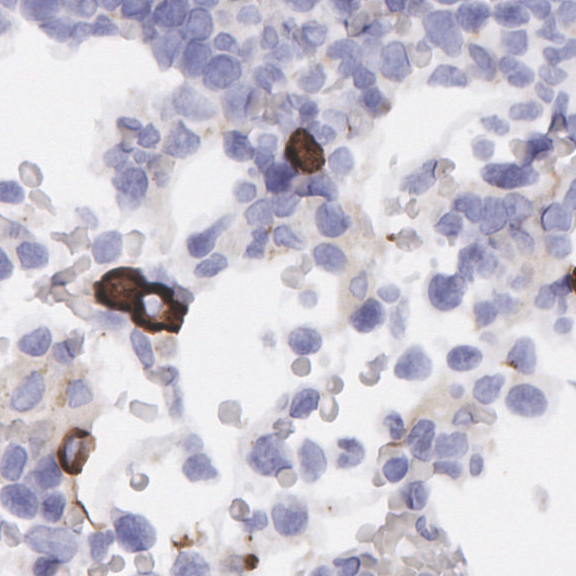

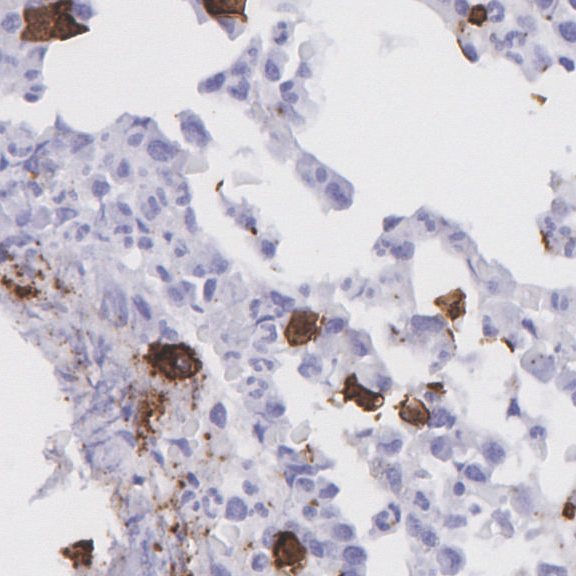

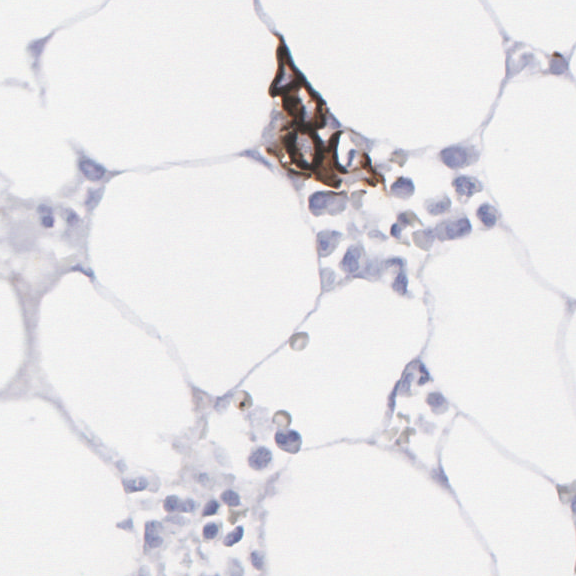

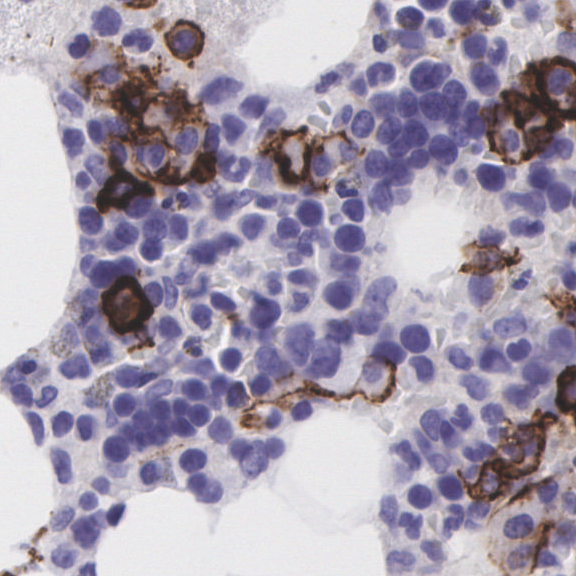

In [3]:
image_folder = '/content/drive/MyDrive/Colab Notebooks/plasma_data/data'
images = []
for filename in os.listdir(image_folder):
    img_path = os.path.join(image_folder, filename)
    img = cv2.imread(img_path)
    images.append(img)
    # Display a few images
    if len(images) < 5:
        cv2_imshow(img)

In [4]:
# Preprocess images
processed_images = []
for img in images:
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    blurred = cv2.GaussianBlur(hsv, (5, 5), 0)
    processed_images.append(blurred)

In [5]:
# Define HSV ranges for brown, blue, and purple
brown_lower = np.array([5, 50, 50])
brown_upper = np.array([40, 255, 255])

blue_lower = np.array([100, 20, 100])
blue_upper = np.array([140, 255, 255])

purple_lower = np.array([120, 10, 100])
purple_upper = np.array([170, 255, 255])

masks = []
for hsv_img in processed_images:
    mask_brown = cv2.inRange(hsv_img, brown_lower, brown_upper)
    mask_blue = cv2.inRange(hsv_img, blue_lower, blue_upper)
    mask_purple = cv2.inRange(hsv_img, purple_lower, purple_upper)
    mask = np.zeros_like(mask_brown)
    mask[mask_brown > 0] = 1  # Brown cells
    mask[mask_blue > 0] = 2   # Blue cells
    mask[mask_purple > 0] = 3 # Purple cells
    masks.append(mask)

In [6]:
# Function to display original image with detected cells highlighted
def highlight_cells(img, mask):
    # Create a copy of the original image
    highlighted_img = img.copy()

    # Highlight brown cells in red
    highlighted_img[mask == 1] = [0, 0, 255]  # Red in BGR

    # Highlight blue cells in blue
    highlighted_img[mask == 2] = [255, 0, 0]  # Blue in BGR

    # Highlight purple cells in purple
    highlighted_img[mask == 3] = [255, 0, 0]  # Purple in BGR

    return highlighted_img

# Display original image with highlighted cells and print counts
for img, mask in zip(images, masks):
    highlighted_img = highlight_cells(img, mask)

    # Count the number of brown, blue, and purple cells
    brown_count = np.sum(mask == 1)
    blue_count = np.sum(mask == 2)
    purple_count = np.sum(mask == 3)

    # Display the highlighted image
    # cv2_imshow(highlighted_img)

    # Print the counts
    print(f"Brown cells: {brown_count}, Blue cells: {blue_count}, Purple cells: {purple_count}")


Brown cells: 3454, Blue cells: 14363, Purple cells: 149454
Brown cells: 10094, Blue cells: 16583, Purple cells: 147026
Brown cells: 2596, Blue cells: 8654, Purple cells: 39972
Brown cells: 14837, Blue cells: 7114, Purple cells: 198797
Brown cells: 13308, Blue cells: 10627, Purple cells: 134555
Brown cells: 9600, Blue cells: 7796, Purple cells: 181204
Brown cells: 3591, Blue cells: 5995, Purple cells: 89885
Brown cells: 8732, Blue cells: 6852, Purple cells: 128387
Brown cells: 15933, Blue cells: 5493, Purple cells: 94320
Brown cells: 4175, Blue cells: 14153, Purple cells: 97081
Brown cells: 5642, Blue cells: 7946, Purple cells: 121837
Brown cells: 1400, Blue cells: 10554, Purple cells: 113875
Brown cells: 12535, Blue cells: 6167, Purple cells: 139714
Brown cells: 10995, Blue cells: 17538, Purple cells: 102451
Brown cells: 5898, Blue cells: 3837, Purple cells: 120603
Brown cells: 24901, Blue cells: 11270, Purple cells: 81039
Brown cells: 11209, Blue cells: 6821, Purple cells: 46943
Brown

In [7]:
augmented_images = []
augmented_masks = []
for img, mask in zip(processed_images, masks):
    # Example: Horizontal flip
    flipped_img = cv2.flip(img, 1)
    flipped_mask = cv2.flip(mask, 1)
    augmented_images.append(flipped_img)
    augmented_masks.append(flipped_mask)

In [8]:
def build_unet(input_shape, num_classes):
    inputs = layers.Input(input_shape)
    # Encoder
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    # Middle
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv3)

    # Decoder
    up4 = layers.Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv3)
    up4 = layers.concatenate([up4, conv2], axis=-1)
    conv4 = layers.Conv2D(128, 3, activation='relu', padding='same')(up4)
    conv4 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv4)

    up5 = layers.Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv4)
    up5 = layers.concatenate([up5, conv1], axis=-1)
    conv5 = layers.Conv2D(64, 3, activation='relu', padding='same')(up5)
    conv5 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv5)

    outputs = layers.Conv2D(num_classes, 1, activation='softmax')(conv5)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

In [9]:
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
import tensorflow as tf

target_size = (512, 512)
resized_images = [cv2.resize(img, target_size) for img in augmented_images]
resized_masks = [cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST) for mask in augmented_masks]

X = np.array(resized_images)
Y = np.array(resized_masks)

# One-hot encoding
Y_one_hot = tf.keras.utils.to_categorical(Y, num_classes=4)

X_train, X_val, Y_train, Y_val = train_test_split(X, Y_one_hot, test_size=0.2)

In [10]:
input_shape = X_train.shape[1:]
num_classes = 4
model = build_unet(input_shape, num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 512, 512, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 512, 512, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 512, 512, 64)   │         36,928 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 256, 256, 64)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 256, 256, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 256, 256, 128)  │        147,584 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 128, 128, 128)  │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 128, 128, 256)  │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 128, 128, 256)  │        590,080 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose          │ (None, 256, 256, 128)  │        131,200 │ conv2d_5[0][0]         │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 256, 256, 256)  │              0 │ conv2d_transpose[0][0… │
│                           │                        │                │ conv2d_3[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 256, 256, 128)  │        295,040 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 256, 256, 128)  │        147,584 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_transpose_1        │ (None, 512, 512, 64)   │         32,832 │ conv2d_7[0][0]         │
│ (Conv2DTranspose)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_1             │ (None, 512, 512, 128)  │              0 │ conv2d_transpose_1[0]… │
│ (Concatenate)             │                        │                │ conv2d_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 512, 512, 64)   │         73,792 │ concatenate_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_9 (Conv2D)    

 Total params: 1,863,044 (7.11 MB)

 Trainable params: 1,863,044 (7.11 MB)

 Non-trainable params: 0 (0.00 B)

In [34]:
model.fit(X_train, Y_train, epochs=25, batch_size=2, validation_data=(X_val, Y_val))

Epoch 1/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 282ms/step - accuracy: 0.9467 - loss: 0.1271 - val_accuracy: 0.9367 - val_loss: 0.1486
Epoch 2/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 288ms/step - accuracy: 0.9410 - loss: 0.1404 - val_accuracy: 0.9487 - val_loss: 0.1243
Epoch 3/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 283ms/step - accuracy: 0.9473 - loss: 0.1261 - val_accuracy: 0.9452 - val_loss: 0.1266
Epoch 4/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 284ms/step - accuracy: 0.9462 - loss: 0.1280 - val_accuracy: 0.9411 - val_loss: 0.1317
Epoch 5/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 294ms/step - accuracy: 0.9495 - loss: 0.1199 - val_accuracy: 0.9451 - val_loss: 0.1280
Epoch 6/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 12s 294ms/step - accuracy: 0.9489 - loss: 0.1213 - val_accuracy: 0.9380 - val_loss: 0.1480
Epoch 7/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 20s 279ms/step - accuracy: 0.9418 - loss: 0.1393 - val_accuracy: 0.9350 - val_loss: 0.1626
Epoch 8/25
41/41 ━━━━━━━━━━━━━━━━━━━━ 21s 282ms/step - accuracy: 0.9401 - loss: 0.1461 - val_accu

In [35]:
# Evaluate on validation set
loss, accuracy = model.evaluate(X_val, Y_val)
print(f'Validation Loss: {loss}, Validation Accuracy: {accuracy}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step - accuracy: 0.9386 - loss: 0.1445
Validation Loss: 0.14450104534626007, Validation Accuracy: 0.9386362433433533


In [36]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score
import pandas as pd

Y_pred = model.predict(X_val)
Y_true_flat = np.argmax(Y_val, axis=-1).reshape(-1)
Y_pred_flat = np.argmax(Y_pred, axis=-1).reshape(-1)

Y_true_flat[Y_true_flat == 3] = 2
Y_pred_flat[Y_pred_flat == 3] = 2


try:
    precision = precision_score(Y_true_flat, Y_pred_flat, average=None)
    recall = recall_score(Y_true_flat, Y_pred_flat, average=None)
    f1 = f1_score(Y_true_flat, Y_pred_flat, average=None)

    class_names = ['Background', 'Brown Cells', 'Blue Cells']
    results = {
        'Class': class_names,
        'Precision': precision,
        'Recall': recall,
        'F1-score': f1
    }

    results_df = pd.DataFrame(results)

    print(results_df)

except ValueError as e:
    print(f"Error: {e}")
    print("Please check the format of Y_true_flat and Y_pred_flat.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
         Class  Precision    Recall  F1-score
0   Background   0.953618  0.977196  0.965263
1  Brown Cells   0.931225  0.941733  0.936450
2   Blue Cells   0.960006  0.903573  0.930935


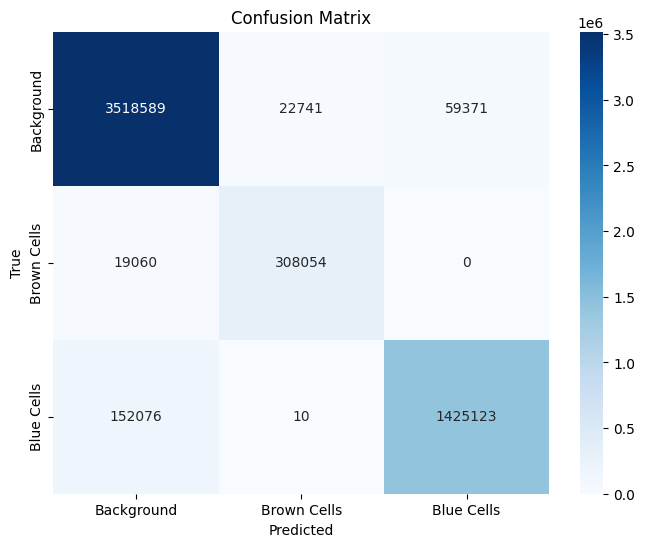

In [37]:
conf_matrix = confusion_matrix(Y_true_flat, Y_pred_flat)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

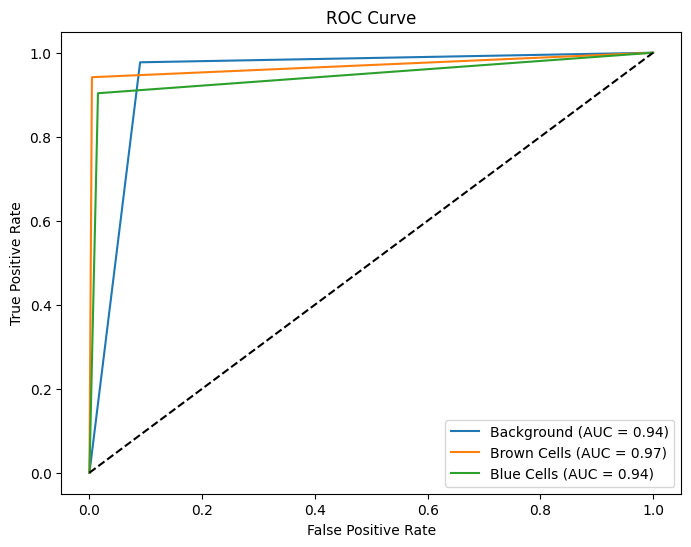

In [38]:
plt.figure(figsize=(8, 6))
for i in range(len(class_names)):
    y_true_binary = (Y_true_flat == i).astype(int)
    y_pred_binary = (Y_pred_flat == i).astype(int)

    fpr, tpr, _ = roc_curve(y_true_binary, y_pred_binary)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')



plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Test Image:


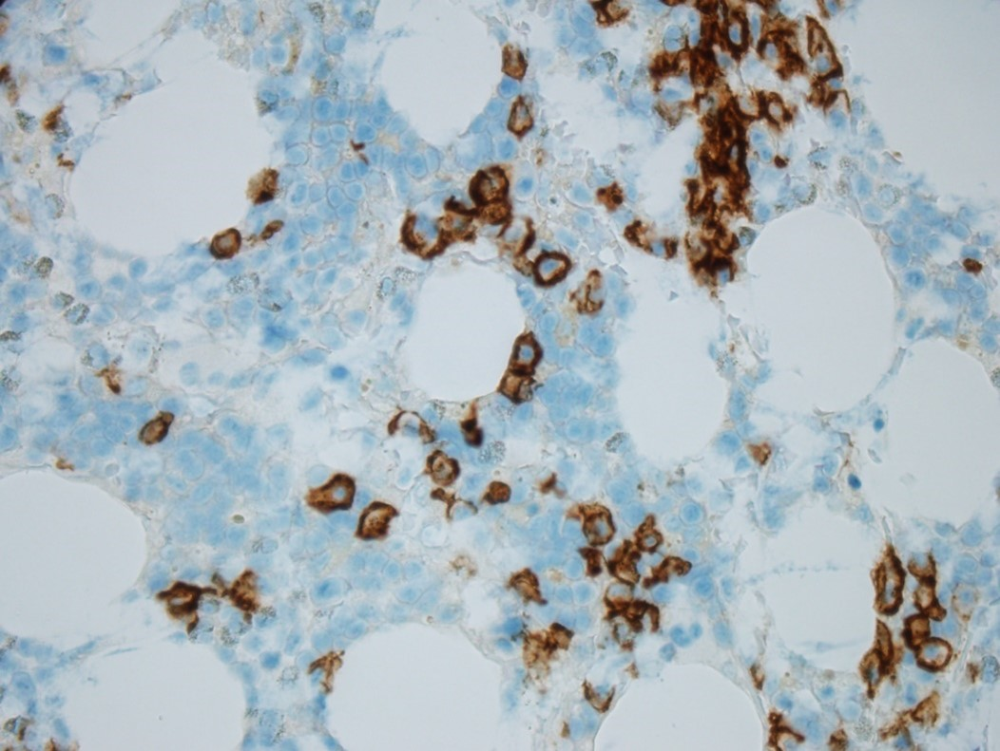

Test Image with Detected Cells:


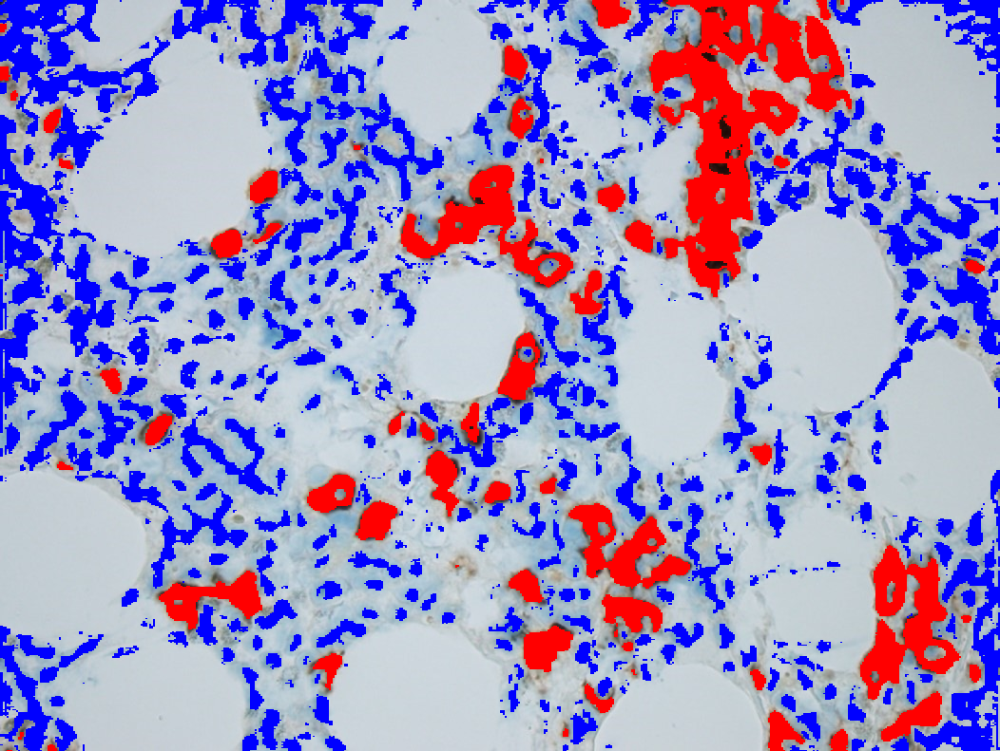

Brown cells detected: 68208
Blue cells detected: 136804
Purple cells detected: 2655
Ratio CD-138 cells detected: 32.8449%


In [40]:
# Load a new image for testing
new_img_path = '/content/WhatsApp Image 2024-12-21 at 6.51.29 AM (1).jpeg'
new_img = cv2.imread(new_img_path)

resized_new_img = cv2.resize(new_img, target_size)

# Preprocess the test image
new_hsv = cv2.cvtColor(resized_new_img, cv2.COLOR_BGR2HSV)
new_blurred = cv2.GaussianBlur(new_hsv, (5, 5), 0)

#expand dim (batch dimension)
new_blurred_expanded = np.expand_dims(new_blurred, axis=0)

# Predict using the trained model
new_pred = model.predict(new_blurred_expanded)
new_pred_mask = np.argmax(new_pred, axis=-1)[0]

# resize mask
new_pred_mask_resized = cv2.resize(new_pred_mask, (new_img.shape[1], new_img.shape[0]), interpolation=cv2.INTER_NEAREST)

highlighted_test_img = new_img.copy()
highlighted_test_img[new_pred_mask_resized == 1] = [0, 0, 255]
highlighted_test_img[new_pred_mask_resized == 2] = [255, 0, 0]
highlighted_test_img[new_pred_mask_resized == 3] = [255, 0, 0]

print("Original Test Image:")
cv2_imshow(new_img)

print("Test Image with Detected Cells:")
cv2_imshow(highlighted_test_img)

brown_count = np.sum(new_pred_mask_resized == 1)
blue_count = np.sum(new_pred_mask_resized == 2)
purple_count = np.sum(new_pred_mask_resized == 3)

print(f"Brown cells detected: {brown_count}")
print(f"Blue cells detected: {blue_count}")
print(f"Purple cells detected: {purple_count}")

if blue_count + brown_count + purple_count > 0:
    ratio_cd138 = ((brown_count) / (blue_count + brown_count + purple_count)) * 100
    print(f"Ratio CD-138 cells detected: {ratio_cd138:.4f}%")
else:
    print("No cells detected.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
Original Test Image:


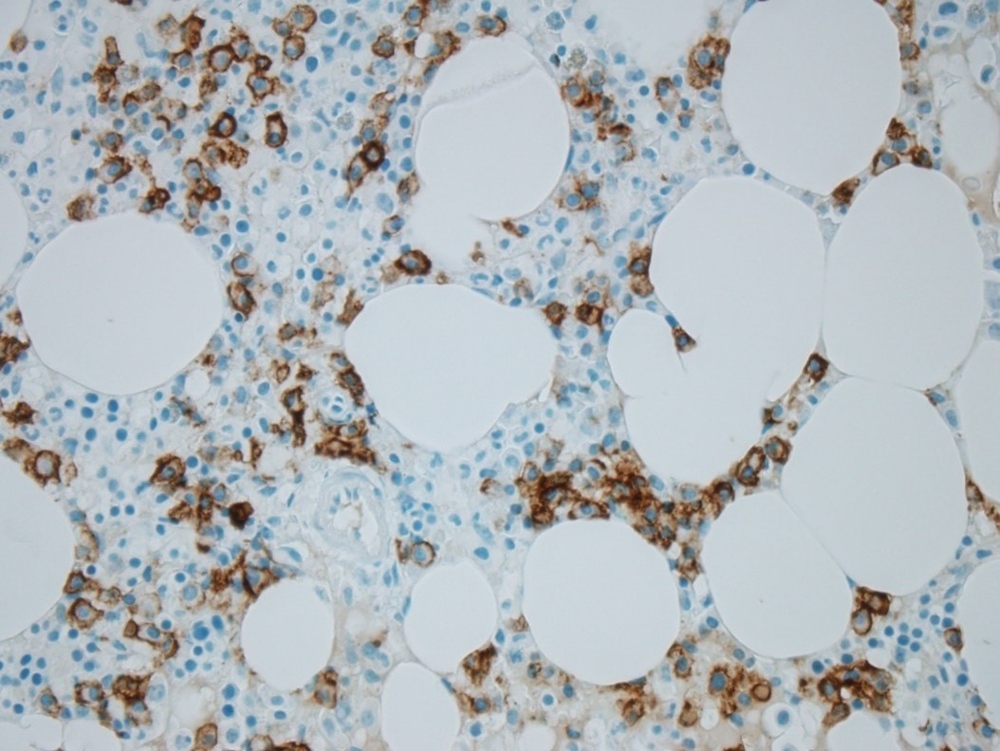

Test Image with Detected Cells:


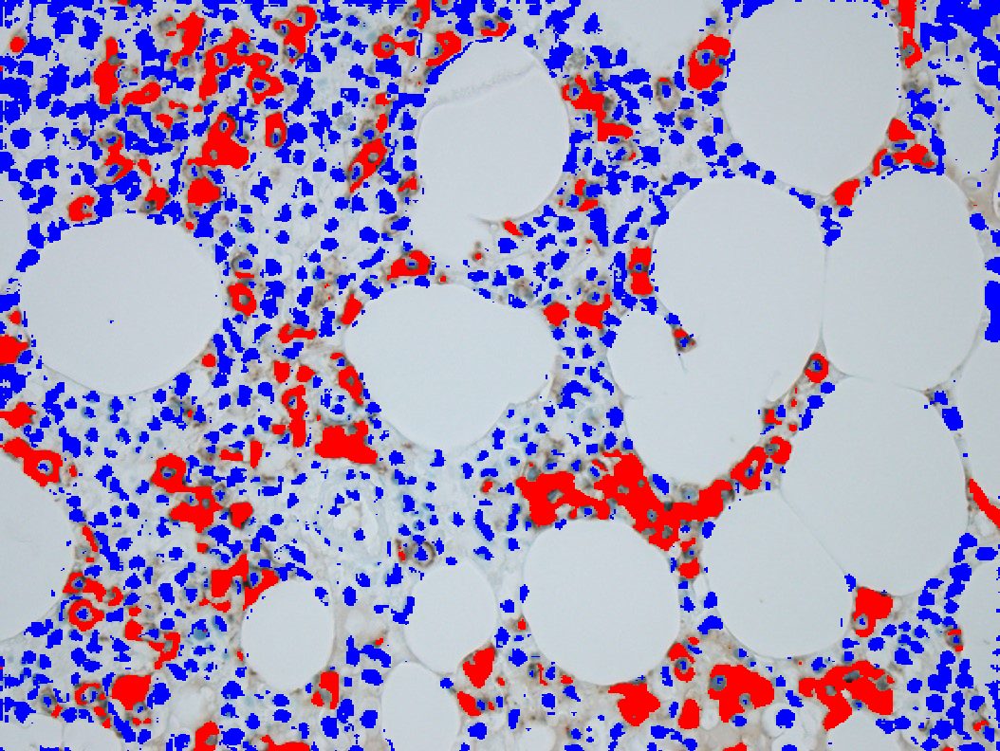

Brown cells detected: 63408
Blue cells detected: 106928
Purple cells detected: 10325
Ratio CD-138 cells detected: 35.0978%


In [41]:
# Load a new image for testing
new_img_path = '/content/WhatsApp Image 2024-12-21 at 6.51.29 AM.jpeg'
new_img = cv2.imread(new_img_path)

resized_new_img = cv2.resize(new_img, target_size)

# Preprocess the test image
new_hsv = cv2.cvtColor(resized_new_img, cv2.COLOR_BGR2HSV)
new_blurred = cv2.GaussianBlur(new_hsv, (5, 5), 0)

#expand dim (batch dimension)
new_blurred_expanded = np.expand_dims(new_blurred, axis=0)

# Predict using the trained model
new_pred = model.predict(new_blurred_expanded)
new_pred_mask = np.argmax(new_pred, axis=-1)[0]

# resize mask
new_pred_mask_resized = cv2.resize(new_pred_mask, (new_img.shape[1], new_img.shape[0]), interpolation=cv2.INTER_NEAREST)

highlighted_test_img = new_img.copy()
highlighted_test_img[new_pred_mask_resized == 1] = [0, 0, 255]
highlighted_test_img[new_pred_mask_resized == 2] = [255, 0, 0]
highlighted_test_img[new_pred_mask_resized == 3] = [255, 0, 0]

print("Original Test Image:")
cv2_imshow(new_img)

print("Test Image with Detected Cells:")
cv2_imshow(highlighted_test_img)

brown_count = np.sum(new_pred_mask_resized == 1)
blue_count = np.sum(new_pred_mask_resized == 2)
purple_count = np.sum(new_pred_mask_resized == 3)

print(f"Brown cells detected: {brown_count}")
print(f"Blue cells detected: {blue_count}")
print(f"Purple cells detected: {purple_count}")

if blue_count + brown_count + purple_count > 0:
    ratio_cd138 = ((brown_count) / (blue_count + brown_count + purple_count)) * 100
    print(f"Ratio CD-138 cells detected: {ratio_cd138:.4f}%")
else:
    print("No cells detected.")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
Original Test Image:


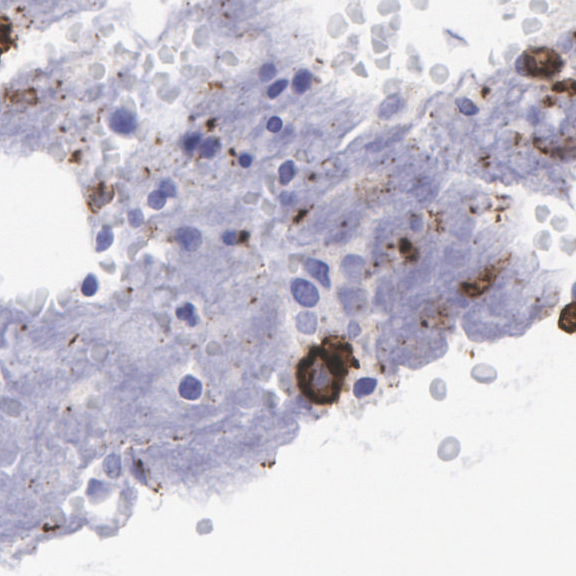

Test Image with Detected Cells:


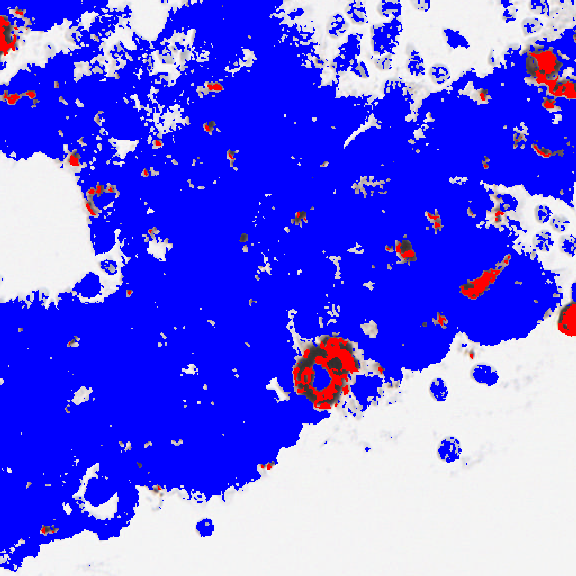

Brown cells detected: 4391
Blue cells detected: 18378
Purple cells detected: 171862
Ratio CD-138 cells detected: 2.2561%


In [42]:
# Load a new image for testing
new_img_path = '/content/CD138-001_0.png'
new_img = cv2.imread(new_img_path)

resized_new_img = cv2.resize(new_img, target_size)

# Preprocess the test image
new_hsv = cv2.cvtColor(resized_new_img, cv2.COLOR_BGR2HSV)
new_blurred = cv2.GaussianBlur(new_hsv, (5, 5), 0)

#expand dim (batch dimension)
new_blurred_expanded = np.expand_dims(new_blurred, axis=0)

# Predict using the trained model
new_pred = model.predict(new_blurred_expanded)
new_pred_mask = np.argmax(new_pred, axis=-1)[0]

# resize mask
new_pred_mask_resized = cv2.resize(new_pred_mask, (new_img.shape[1], new_img.shape[0]), interpolation=cv2.INTER_NEAREST)

highlighted_test_img = new_img.copy()
highlighted_test_img[new_pred_mask_resized == 1] = [0, 0, 255]
highlighted_test_img[new_pred_mask_resized == 2] = [255, 0, 0]
highlighted_test_img[new_pred_mask_resized == 3] = [255, 0, 0]

print("Original Test Image:")
cv2_imshow(new_img)

print("Test Image with Detected Cells:")
cv2_imshow(highlighted_test_img)

brown_count = np.sum(new_pred_mask_resized == 1)
blue_count = np.sum(new_pred_mask_resized == 2)
purple_count = np.sum(new_pred_mask_resized == 3)

print(f"Brown cells detected: {brown_count}")
print(f"Blue cells detected: {blue_count}")
print(f"Purple cells detected: {purple_count}")

if blue_count + brown_count + purple_count > 0:
    ratio_cd138 = ((brown_count) / (blue_count + brown_count + purple_count)) * 100
    print(f"Ratio CD-138 cells detected: {ratio_cd138:.4f}%")
else:
    print("No cells detected.")

In [ ]:
model.save('/content/drive/MyDrive/Colab Notebooks/plasma_data/plasma_model.h5')